# Load DFEI Run3 Dataset and train a BDT on it to distinguish between LCA0 and the rest

2k

Evaluating XGBoost model for onlyLongUp on training sample
Accuracy: 94.78% 
Balanced accuracy: 96.79% 
precision: 94.98% 
recall: 98.81%
Evaluating XGBoost model for onlyLongUp on validation sample
Accuracy: 94.17% 
Balanced accuracy: 66.52% 
precision: 87.08% 
recall: 38.79%

Evaluating XGBoost model for onlyLongDown on training sample
Accuracy: 93.45% 
Balanced accuracy: 95.76% 
precision: 93.73% 
recall: 98.07%
Evaluating XGBoost model for onlyLongDown on validation sample
Accuracy: 93.07% 
Balanced accuracy: 68.23% 
precision: 86.32% 
recall: 43.32%

20k
Evaluating XGBoost model for onlyLongUp on training sample
Accuracy: 83.51% 
Balanced accuracy: 85.38% 
precision: 84.10% 
recall: 87.27%
Evaluating XGBoost model for onlyLongUp on validation sample
Accuracy: 83.35% 
Balanced accuracy: 78.85% 
precision: 81.71% 
recall: 74.34%

Evaluating XGBoost model for onlyLongDown on training sample
Accuracy: 83.02% 
Balanced accuracy: 85.03% 
precision: 83.67% 
recall: 87.04%
Evaluating XGBoost model for onlyLongDown on validation sample
Accuracy: 82.81% 
Balanced accuracy: 78.54% 
precision: 81.22% 
recall: 74.27%

#with IP and PT, 20k
Evaluating XGBoost model for onlyLongDown on training sample
Accuracy: 68.50% 
Balanced accuracy: 84.23% 
precision: 99.99% 
recall: 100.00%
Evaluating XGBoost model for onlyLongDown on validation sample
Accuracy: 68.59% 
Balanced accuracy: 83.81% 
precision: 99.99% 
recall: 99.07%

#noweights
Evaluating XGBoost model for onlyLongDown on training sample
Accuracy: 68.50% 
Balanced accuracy: 84.23% 
precision: 0.41% 
recall: 100.00%
Evaluating XGBoost model for onlyLongDown on validation sample
Accuracy: 68.59% 
Balanced accuracy: 83.77% 
precision: 0.40% 
recall: 99.00%

#pt_ip reco
Evaluating XGBoost model for onlyLongDown on validation sample
Predicted         0         1       All
Actual                                 
0.0        21288367  27196281  48484648
1.0             956     60964     61920
All        21289323  27257245  48546568
Accuracy: 43.98% 
Balanced accuracy: 71.01% 
precision: 99.98% 
recall: 98.12%

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from os import makedirs
import glob
from wmpgnn.configs.config_loader import ConfigLoader
from wmpgnn.datasets.data_handler import DataHandler
#from wmpgnn.model.model_loader import ModelLoader

def flatten_dict(d, parent_key='', sep='_'):
    items = []
    for k, v in d.items():
        new_key = f"{parent_key}{sep}{k}" if parent_key else k
        if isinstance(v, dict): 
            items.extend(flatten_dict(v, new_key, sep=sep).items())
        else:
            items.append((new_key, v))
    return dict(items)

def load_AsNumpy(dataset_paths):
    """
    Load the dataset from the specified path and name.
    """
    arrays = [np.load(file, allow_pickle=True).item() for file in dataset_paths]
    datasets = {}
    for k in arrays[0].keys():
        if arrays[0][k].dtype != '<U19':
            dfs = [pd.DataFrame(arr[k]) for arr in arrays if arr[k].shape[0] > 0]
            if len(dfs) == 0:
                continue
            datasets[k] = pd.concat(dfs,axis=0, keys=[i for i in range(len(dfs))])
        else:
            print(k,arrays[0][k])
            datasets[k] = arrays[0][k]
    datasets['Nevents'] = np.array([len(dfs)])
    return datasets

def ApplyCuts(df, cut_name):
    """
    Apply cuts to a DataFrame.
    """
    cuts = {
        'onlyLong': "ParticleRecoType == 0",
        'onlyUpDown': "(ParticleRecoType == 1)|(ParticleRecoType == 2)",
        'onlyNeutral': "ParticleRecoType >= 3",
        }
    
    if cut_name in cuts.keys():
        try:
            print(f"Applying cut: {cut_name}")
            return df.query(cuts[cut_name])
        except:
            print(f"{cuts[cut_name]} cannot be applied. Returning original DataFrame.")
            return df
    else:
        print(f"Cut {cut_name} not found. Returning original DataFrame.")
        return df

In [3]:
# Define the config files to compare
configs_to_compare = {
    #"mlp_hom50": "mp_gnn_run3.yaml",
    #"mlp_hom100": "mp_gnn_run3_90k.yaml",
    #"mlp_het": "heteromp_gnn_run3.yaml",
    #"mlp_het_pythia": "heteromp_gnn_pythia.yaml",
    #"full_sim": "heteromp_gnn_run3.yaml",
    #"onlyLongUp": "heteromp_gnn_run3_onlyLongUp.yaml",
    "onlyLongDown": "heteromp_gnn_run3_onlyLongDown.yaml",
    #"pythia": "heteromp_gnn_pythia.yaml",
}

node_features_LCA = dict()
node_features_LCA[0] = ['xProd_reco','yProd_reco','zProd_reco','px_reco','py_reco','pz_reco','px_reco_associated','py_reco_associated','pz_reco_associated', 'charge','xPV_reco', 'yPV_reco', 'zPV_reco']
node_features_LCA[1] = ['xProd_reco','yProd_reco','zProd_reco','px_reco','py_reco','pz_reco','charge', 'ParticleRecoType','Prob_ghost','pt_reco','associated_ip_reco','associated_xPV_reco', 'associated_yPV_reco', 'associated_zPV_reco']+['xPV_reco', 'yPV_reco', 'zPV_reco']
edge_features_LCA = ['abs_delta_z0_reco', 'delta_RadialDist_reco', 'delta_phi_reco', 'delta_eta_reco']
bdt_features = {}
bdt_features.update({f"e_{i}": edge_features_LCA[i] for i in range(len(edge_features_LCA))})
bdt_features.update({f"s_{i}": node_features_LCA[1][i] for i in range(len(node_features_LCA[1]))})
bdt_features.update({f"r_{i}": node_features_LCA[1][i] for i in range(len(node_features_LCA[1]))})

# Load the config files
config_loader,graphs,datasets,files_collection = {},{},{},{}
for label, yml in configs_to_compare.items():
    print(f"Loading {label} config file: {yml}")
    config_loader[label] = ConfigLoader(f"config_files/{yml}", environment_prefix="DL")
    flatten_config = flatten_dict(config_loader[label].config)
    
    evt_max_train = config_loader[label].get("dataset.evt_max_train")
    evt_max_val = config_loader[label].get("dataset.evt_max_val")
    data_path = config_loader[label].get("dataset.data_dir")
    # single or multiple data paths
    if isinstance(data_path, str):
        data_paths = [data_path]
    elif isinstance(data_path, list):
        data_paths = data_path
    else:
        raise Exception(f"Unexpected data path type {type(data_path)}. Please use str or list.")
    
    files_input_tr, files_target_tr = [], []
    files_input_vl, files_target_vl = [], []
    files_input_tst, files_target_tst = [], []
    # get all files in the data paths
    for data_path in data_paths:
        print(f"Loading data from {data_path}")
        files_input_tr   += glob.glob(f'{data_path}/training_dataset/input_*')
        files_target_tr  += glob.glob(f'{data_path}/training_dataset/target_*')
        files_input_vl   += glob.glob(f'{data_path}/validation_dataset/input_*')
        files_target_vl  += glob.glob(f'{data_path}/validation_dataset/target_*')
        files_input_tst  += glob.glob(f'{data_path}/test_dataset/input_*')
        files_target_tst += glob.glob(f'{data_path}/test_dataset/target_*')
    
    # reduce the number of events if needed
    if isinstance(evt_max_train, int) and evt_max_train > 0:
        files_input_tr = files_input_tr[:evt_max_train]
        files_target_tr = files_target_tr[:evt_max_train]
    if isinstance(evt_max_val, int) and evt_max_val > 0:
        files_input_vl = files_input_vl[:evt_max_val]
        files_target_vl = files_target_vl[:evt_max_val]
    
    print(f"Using {len(files_input_tr)} events for training")
    print(f"Using {len(files_input_vl)} events for validation")

    
    event_type = config_loader[label].get("dataset.event_type")
    batch_size =  config_loader[label].get("training.batch_size")

    graphs[label] = {}
    datasets[label] = {}
    files_collection[label] = {}
    for files, sample in zip(
        [files_input_tr, files_target_tr, files_input_vl, files_target_vl],
        ["input_train", "target_train", "input_val", "target_val"]
    ):
        files_collection[label][sample] = files
        if len(files) > 0:
            graphs[label][sample] = load_AsNumpy(files)
        else:
            graphs[label][sample] = None
    for sample in ['train','val']:
        if graphs[label][f"input_{sample}"] is not None:
            datasets[label][f"input_{sample}"] = pd.DataFrame(graphs[label][f"input_{sample}"]['nodes'],columns=node_features_LCA[event_type])
            #if graphs[label][f"target_{sample}"] is not None:
            #    datasets[label][f"input_{sample}"]['target'] = graphs[label][f"target_{sample}"]['nodes']
    #for sample in ['target_train','target_val']:
    #    if graphs[label][sample] is not None:
    #        datasets[label][sample] = pd.DataFrame(graphs[label][sample]['nodes'],columns=[f"LCA{i}" for i in range(config_loader[label].get("model.LCA_classes"))])

Loading onlyLongUp config file: heteromp_gnn_run3_onlyLongUp.yaml
Loading data from /user/gr1/lhcb/scapelli/DFEI/lhcbdfei/data_handling/input_formatting/run3_onlyLong_magup
Using 20000 events for training
Using 9074 events for validation
Loading onlyLongDown config file: heteromp_gnn_run3_onlyLongDown.yaml
Loading data from /user/gr1/lhcb/scapelli/DFEI/lhcbdfei/data_handling/input_formatting/run3_onlyLong_magdown
Using 20000 events for training
Using 9076 events for validation
nodes_features ['xProd_reco' 'yProd_reco' 'zProd_reco' 'px_reco' 'py_reco' 'pz_reco'
 'charge' 'ParticleRecoType' 'Prob_ghost' 'pt_reco' 'associated_ip_reco'
 'associated_xPV_reco' 'associated_yPV_reco' 'associated_zPV_reco'
 'xPV_reco' 'yPV_reco' 'zPV_reco']
nodes_features ['xProd_reco' 'yProd_reco' 'zProd_reco' 'px_reco' 'py_reco' 'pz_reco'
 'charge' 'ParticleRecoType' 'Prob_ghost' 'pt_reco' 'associated_ip_reco'
 'associated_xPV_reco' 'associated_yPV_reco' 'associated_zPV_reco'
 'xPV_reco' 'yPV_reco' 'zPV_reco'

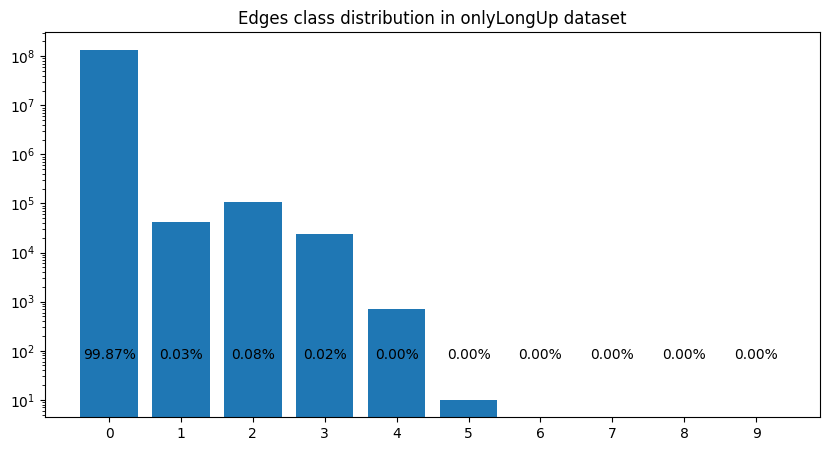

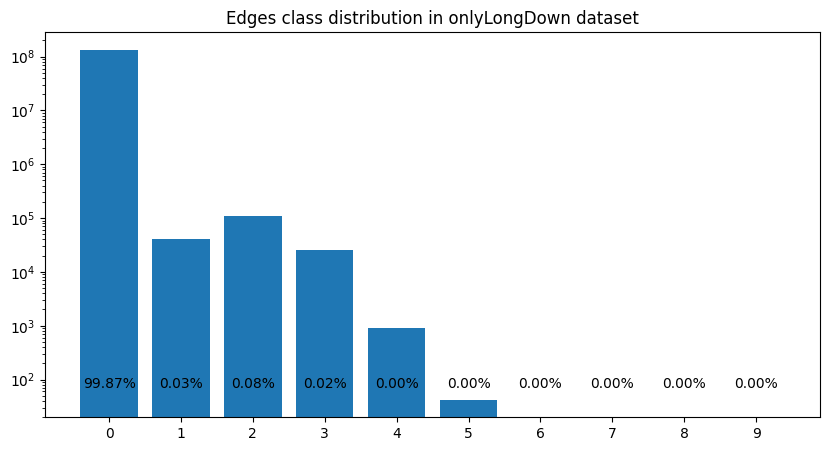

In [4]:
for label in configs_to_compare.keys():
    fig,ax = plt.subplots(figsize=(10, 5))
    try:
        graph = graphs[label]['target_train']
        graph['edges'].shape[1]
    except:
        continue
    count = {}
    for i in range(graph['edges'].shape[1]):
        count[i] = graph['edges'].loc[:,i].sum()
    plt.bar(count.keys(), count.values())
    plt.xticks(np.arange(0,10,1))
    plt.yscale('log')
    plt.title(f"Edges class distribution in {label} dataset")
    normalized_counts = {k: 100*v / sum(count.values()) for k, v in count.items()}
    
    # Add numbers over the bars
    for x, y in normalized_counts.items():
        plt.text(x, 60, f"{y:.2f}%", ha='center', va='bottom')
    
    plt.show()

# Create XGB model

In [26]:
# create XGB model
from xgboost import XGBClassifier
from sklearn.metrics import balanced_accuracy_score, accuracy_score, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score, precision_score, recall_score
from sklearn.utils.class_weight import compute_sample_weight

def train_xgb_model(X, y, weights, binary_task=True):
    """
    Train an XGBoost model.
    """
    num_class=y.shape[1]
    
    if binary_task:
        objective = "binary:logistic"
        # Convert y to binary if it is not already
        if y.shape[1] > 1:
            y = 1 - y.iloc[:, 0] # 1 where is zero
    else:
        objective = "multi:softprob"
        y = np.argmax(y, axis=1)

    model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', objective=objective, num_class=num_class)

    model.fit(X, y, sample_weight=weights)
    return model

def evaluate_xgb_model(y_true, y_prob, sample_weight, binary_task=True):
    """
    Evaluate the XGBoost model.
    """
    
    thr = 0.5
    if binary_task:
        y_pred = (1-y_prob[:,0] > thr).astype(int)
        y_true = 1 - y_true.iloc[:, 0].values
    else:
        y_pred = np.argmax(y_prob, axis=1)
        y_true = np.argmax(y_true, axis=1)
    

    accuracy = accuracy_score(y_true, y_pred)
    bal_accuracy = balanced_accuracy_score(y_true, y_pred, sample_weight=sample_weight)
    if binary_task:
        precision = precision_score(y_true, y_pred, sample_weight=sample_weight, zero_division=0)
        recall = recall_score(y_true, y_pred, sample_weight=sample_weight, zero_division=0)
    else:
        precision = precision_score(y_true, y_pred, average='weighted', sample_weight=sample_weight, zero_division=0)
        recall = recall_score(y_true, y_pred, average='weighted', sample_weight=sample_weight, zero_division=0)
        
    
    #confusion matrix
    confusion_matrix = pd.crosstab(y_true, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)
    print(confusion_matrix)
    # normalize the confusion matrix
    normalized_confusion_matrix = confusion_matrix.apply(lambda x: 100*x/x['All'],axis=1)
    print("Normalized confusion matrix [%]:")
    print(normalized_confusion_matrix.round(2).iloc[:-1,:])
    
    # Number of classes
    num_classes = y_prob.shape[1] if not binary_task else 2
    print(f"Number of classes: {num_classes}")
    # Initialize precision and recall arrays
    scores = {}
    scores['precision'] = np.zeros(num_classes)
    scores['recall'] = np.zeros(num_classes)

    # Calculate precision and recall for each class
    for i in range(num_classes):
        TP = confusion_matrix.loc[i, i]  # True Positives
        FP = np.sum(confusion_matrix.iloc[:-1, i]) - TP  # False Positives
        FN = np.sum(confusion_matrix.iloc[i, :-1]) - TP  # False Negatives
        #print(f"Class {i} - TP: {TP}, FP: {FP}, FN: {FN}")
        scores['precision'][i] = TP / (TP + FP) if (TP + FP) > 0 else 0
        scores['recall'][i] = TP / (TP + FN) if (TP + FN) > 0 else 0

    scores['confusion_matrix'] = confusion_matrix
    scores['normalized_confusion_matrix'] = normalized_confusion_matrix
    scores['accuracy'] = accuracy
    scores['bal_accuracy'] = bal_accuracy
    
    # Print results
    for i in range(num_classes):
        print(f"Class {i}:  Recall = {100*scores['recall'][i]:.2f}%, Precision = {100*scores['precision'][i]:.2f}%")
    
    print(f"Accuracy: {100*accuracy:.2f}% \nBalanced accuracy: {100*bal_accuracy:.2f}% \nprecision: {100*precision:.2f}% \nrecall: {100*recall:.2f}%")
    return scores

def compute_roc_auc(model, X, y):
    """
    Compute ROC AUC for the XGBoost model.
    """
    
    # compute ROC curve
    y_prob = 1 - model.predict_proba(X)[:, 0]
    y_true = (1-y.loc[:,0]).values
    fpr, tpr, thresholds = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    print(f"ROC AUC: {roc_auc:.2f}")
    
    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(tpr, 1-fpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
    plt.grid(True)
    plt.xlabel('Signal efficiency')
    plt.ylabel('Bkg rejection')
    plt.title('ROC Curve')
    plt.legend(loc='lower left')
    plt.tight_layout()
    plt.show()

def plot_feature_importance(model, feature_names):
    """
    Plot feature importance of the XGBoost model.
    """
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    plt.figure(figsize=(10, 6))
    plt.title("Feature Importances")
    plt.bar(range(len(importances)), importances[indices], align='center')
    plt.xticks(range(len(importances)), [feature_names[i] for i in indices], rotation=90)
    plt.xlim([-1, len(importances)])
    plt.show()
    
def make_dataset(graph,sample, nLCA=5):
    """
    Create a dataset from the graph depending on the data_type 'nodes' or 'edges'
    """
    features,targets = list(),list()
    for nEv in range(graph[f'input_{sample}']['Nevents'][0]):
        print(f"Processing {sample} sample, event {nEv}", end='\r')
        non_duplicated_index = ~graph[f'input_{sample}']['nodes'].loc[nEv].index.duplicated()
        senders_index = graph[f'input_{sample}']['senders'].loc[nEv][0].values
        senders_features = graph[f'input_{sample}']['nodes'].loc[nEv][non_duplicated_index].reindex(senders_index).reset_index(drop=True).rename(columns=lambda x: f's_{x}')
        receivers_index = graph[f'input_{sample}']['receivers'].loc[nEv][0].values
        receivers_features = graph[f'input_{sample}']['nodes'].loc[nEv][non_duplicated_index].reindex(receivers_index).reset_index(drop=True).rename(columns=lambda x: f'r_{x}')
        edge_features = graph[f'input_{sample}']['edges'].loc[nEv].rename(columns=lambda x: f'e_{x}')
        features.append(pd.concat([edge_features,senders_features, receivers_features], axis=1))
        targets.append(graph[f'target_{sample}']['edges'].loc[nEv].loc[:,:nLCA-1])
    X = pd.concat(features, axis=0).reset_index(drop=True)
    y = pd.concat(targets, axis=0).reset_index(drop=True)
    print("\nDone, sample shape:", X.shape)
    return X, y

def plot_features(X,y,binary_task=True):
    """
    Plot features of the dataset.
    """
    
    Nfeatures = X_train.shape[1]
    features = X_train.columns.tolist()
    if binary_task:
        fig, axes = plt.subplots(Nfeatures, 2, figsize=(10, 5 * Nfeatures))
        y = 1-y.iloc[:,0]
        is_signal = y == 1
        for i,col in enumerate(features):
            for j in range(2):
                index = i,j
                axes[index].hist(X.loc[is_signal,col], bins=50,histtype='step', label=f"Sig", density=True)
                axes[index].hist(X.loc[~is_signal,col], bins=50,histtype='step', label=f"Bkg", density=True)
            
                #axes[index].set_title(col)
                axes[index].set_xlabel(col)
                axes[index].legend()
            axes[i,1].set_yscale('log')
        plt.tight_layout()
        plt.show()
    else:
        n_classes = y.shape[1]
        fig, axes = plt.subplots(Nfeatures, 1, figsize=(5, 5 * Nfeatures))
        for i,col in enumerate(features):
            for j in range(n_classes):
                axes[i].hist(X.loc[y.iloc[:,j] == 1,col], bins=50,histtype='step', label=f"Class {j}", density=True)
                axes[i].set_xlabel(col)
                axes[i].legend()
        plt.tight_layout()
        plt.show()

def plot_features_prediction(X,y,y_prob):
    """
    Plot features of the dataset with cuts on binary predictions.
    """
    Nfeatures = X_train.shape[1]
    features = X_train.columns.tolist()
    N_class = y_prob.shape[1]
    fig, axes = plt.subplots(Nfeatures, N_class, figsize=(5*N_class, 5 * Nfeatures))
    thrs = [0,0.2,0.5,0.8]
    for i,col in enumerate(features):
        for j in range(N_class):
            #print(f"Plotting feature {col} for class {j}")
            den = y.loc[:,j].sum()
            index = i,j
            for thr in thrs:
                pass_cut = (y_prob[:,j] > thr) & (y.loc[:,j] == 1)
                eff = pass_cut.sum() / den if den > 0 else 0
                axes[index].hist(X.loc[pass_cut,col], bins=50,histtype='step', label=f"prob {j} > {thr} [{100*eff:.2f}%]", density=False)
            axes[index].set_xlabel(bdt_features[col])
            axes[index].set_title(f"LCA{j}")
            axes[index].legend()
    plt.tight_layout()
    plt.show()



In [6]:
save_models = True
load_models = True

import pickle
# Train and evaluate XGBoost model for each config
Models = { 'models': {}, 'datasets': {} }
models_output_path = "/user/gr1/lhcb/scapelli/DFEI/weighted_MP_gnn/outputs/xgb"
makedirs(models_output_path, exist_ok=True)


In [7]:

for label in configs_to_compare.keys():
    
    print(f"Build dataset for {label}")
    X_train, y_train = make_dataset(graphs[label], 'train')
    X_val, y_val = make_dataset(graphs[label], 'val')
    weights_train = compute_sample_weight(class_weight='balanced', y=y_train)
    weights_val = compute_sample_weight(class_weight='balanced', y=y_val)

    binary_task = False
    if y_train.shape[1] == 1: # if single class force to binary task
        binary_task = True
        
    # Train the model
    print(f"Training XGBoost model for {label}")
    xgb_model = train_xgb_model(X_train, y_train, weights_train,binary_task=binary_task)
        
    print(f"Evaluating XGBoost model for {label}")
    y_prob_train = xgb_model.predict_proba(X_train)
    y_prob_val = xgb_model.predict_proba(X_val)
    print("storing model and datasets")
    
    Models['models'][label] = xgb_model
    Models['datasets'][label] = {
        'X_train': X_train,
        'y_train': y_train,
        'X_val': X_val,
        'y_val': y_val,
        'w_train': weights_train,
        'w_val': weights_val,
        'y_prob_train': y_prob_train,
        'y_prob_val': y_prob_val,
    }
    # save dictionary to file
    if save_models:
        print(f"Saving model and datasets for {label}")
        with open(f"{models_output_path}/dataset_{label}.pkl", 'wb') as f:
            pickle.dump(Models['datasets'][label], f)
        with open(f"{models_output_path}/model_{label}.pkl", 'wb') as f:
            pickle.dump(Models['models'][label], f)

Build dataset for onlyLongDown


Processing train sample, event 16100
Done, sample shape: (108291422, 38)
Processing val sample, event 7290
Done, sample shape: (48546568, 38)
Training XGBoost model for onlyLongDown


/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/xgboost/core.py:158: UserWarning: [13:59:01] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Evaluating XGBoost model for onlyLongDown
storing model and datasets
Saving model and datasets for onlyLongDown


In [16]:
if load_models:
    print("Loading models and datasets")
    Models = { 'models': {}, 'datasets': {} }
    for label in configs_to_compare.keys():
        # Load the datasets and models
        with open(f"{models_output_path}/dataset_{label}.pkl", 'rb') as f:
            Models['datasets'][label] = pickle.load(f)
        with open(f"{models_output_path}/model_{label}.pkl", 'rb') as f:
            Models['models'][label] = pickle.load(f)
            

Loading models and datasets


Evaluating XGBoost model for onlyLongDown on training sample
Predicted         0         1         2         3      4        All
Actual                                                             
0          31929270  17773788  40711709  17688159  49008  108151934
1                 0     25595      5916      1591     14      33116
2                 0     22449     52399     11124     66      86038
3                 0      1583      1414     16641     90      19728
4                 0         0         0         0    606        606
All        31929270  17823415  40771438  17717515  49784  108291422
Normalized confusion matrix [%]:
Predicted      0      1      2      3       4    All
Actual                                              
0          29.52  16.43  37.64  16.35    0.05  100.0
1           0.00  77.29  17.86   4.80    0.04  100.0
2           0.00  26.09  60.90  12.93    0.08  100.0
3           0.00   8.02   7.17  84.35    0.46  100.0
4           0.00   0.00   0.00   0.00  100.0

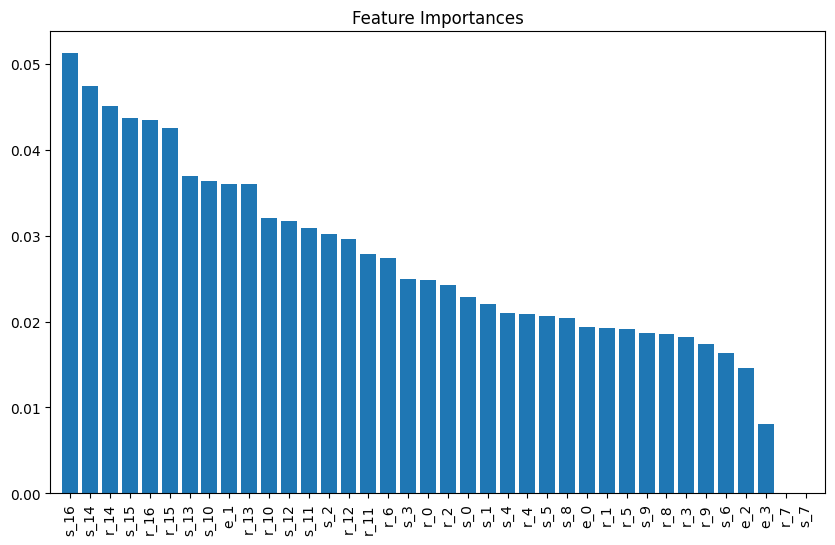

In [17]:
metrics = {}
for label in Models['models'].keys():
    # Plot features
    X_train = Models['datasets'][label]['X_train']
    y_train = Models['datasets'][label]['y_train']
    X_val = Models['datasets'][label]['X_val']
    y_val = Models['datasets'][label]['y_val']
    w_train = Models['datasets'][label]['w_train']
    w_val = Models['datasets'][label]['w_val']
    xgb_model = Models['models'][label]
    y_prob_val = Models['datasets'][label]['y_prob_val']
    y_prob_train = Models['datasets'][label]['y_prob_train']
    
    binary_task = False
    
    # Evaluate the model
    print(f"Evaluating XGBoost model for {label} on training sample")
    metrics[label] = {}
    metrics[label]['train'] = evaluate_xgb_model(y_train, y_prob_train, w_train, binary_task=binary_task)
    print(f"Evaluating XGBoost model for {label} on validation sample")
    metrics[label]['val'] = evaluate_xgb_model(y_val, y_prob_val, w_val, binary_task=binary_task)
    
    #plot_features(X_train, y_train, X_val, y_val)
    # Plot feature importance
    plot_feature_importance(xgb_model, X_train.columns.tolist())


ROC AUC onlyLongDown train: 0.97
ROC AUC onlyLongDown val : 0.95


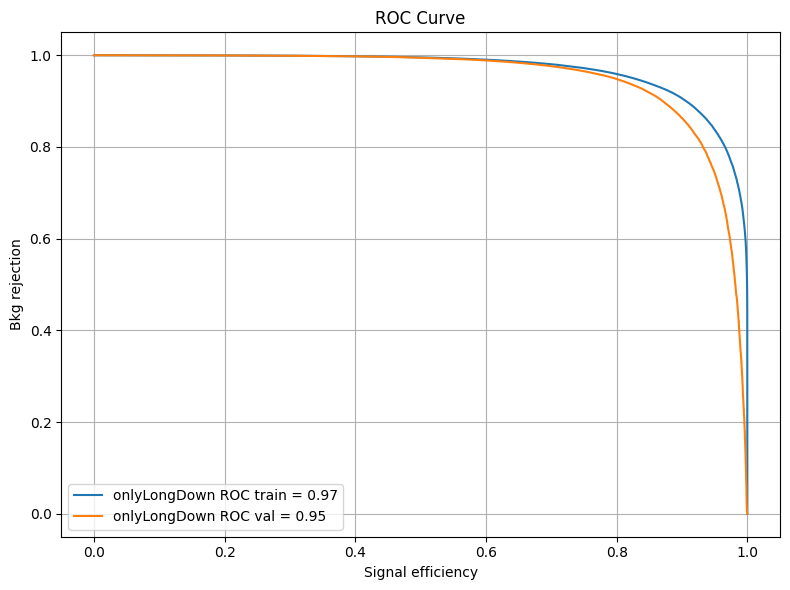

In [18]:
# compute ROC curve
fig,ax = plt.subplots(figsize=(8, 6))

for label in Models['models'].keys():
    
    y_true_train = Models['datasets'][label]['y_train'].values
    y_true_val = Models['datasets'][label]['y_val'].values
    if y_true_train.shape[1] > 1:
        y_true_train = 1-y_true_train[:,0]
    if y_true_val.shape[1] > 1:
        y_true_val = 1-y_true_val[:,0]
    
    fpr_train, tpr_train, _ = roc_curve(y_true_train, 1-Models['datasets'][label]['y_prob_train'][:,0])
    fpr_val, tpr_val, _ = roc_curve(y_true_val, 1-Models['datasets'][label]['y_prob_val'][:,0])
    roc_auc_train = auc(tpr_train, 1-fpr_train)
    roc_auc_val = auc(tpr_val, 1-fpr_val)
    print(f"ROC AUC {label} train: {roc_auc_train:.2f}")
    print(f"ROC AUC {label} val : {roc_auc_val:.2f}")
    
    # Plot ROC curve
    ax.plot(tpr_train, 1-fpr_train, label=f'{label} ROC train = {roc_auc_train:.2f}')
    ax.plot(tpr_val, 1-fpr_val, label=f'{label} ROC val = {roc_auc_val:.2f}')
    
plt.grid(True)
plt.xlabel('Signal efficiency')
plt.ylabel('Bkg rejection')
plt.title('ROC Curve')
plt.legend(loc='lower left')
plt.tight_layout()
plt.show()

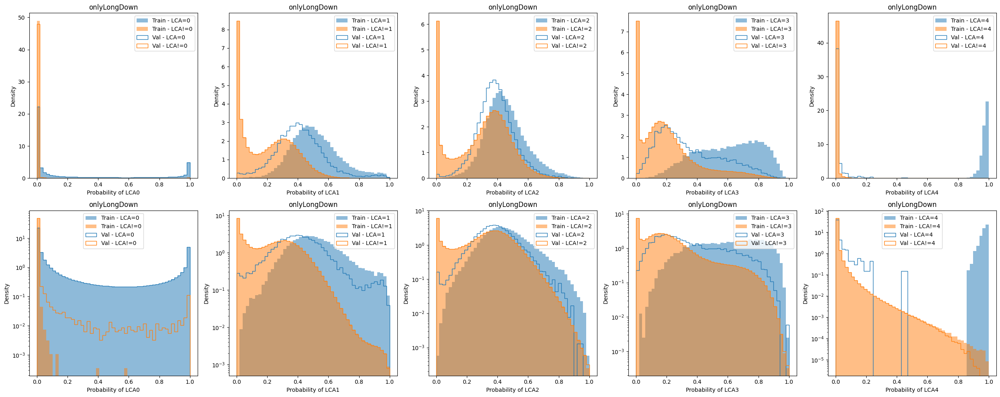

In [32]:
def plot_prediction(datasets,binary_task=True):
    """
    Plot the prediction of the model for each class in Train and Validation datasets.
    """
    for label,dataset in datasets.items():
        if binary_task:
            nLCA = 2
            fig, axes = plt.subplots(2, 1, figsize=(10, 10))
            y_prob_train = dataset['y_prob_train'][:, 0]
            y_prob_val = dataset['y_prob_val'][:, 0]
            y_true_train = dataset['y_train'].argmax(axis=1).values
            y_true_val = dataset['y_val'].argmax(axis=1).values
            bins = np.linspace(0, 1, 50)
            for index in [0,1]:
                axes[index].hist(y_prob_train[y_true_train == 1], bins=bins, histtype='bar', alpha=0.5, label='Train - Signal', density=True, color='tab:blue')
                axes[index].hist(y_prob_train[y_true_train == 0], bins=bins, histtype='bar', alpha=0.5, label='Train - Background', density=True, color='tab:orange')
                axes[index].hist(y_prob_val[y_true_val == 1], bins=bins, histtype='step', label='Validation - Signal', density=True, color='tab:blue')
                axes[index].hist(y_prob_val[y_true_val == 0], bins=bins, histtype='step', label='Validation - Background', density=True, color='tab:orange')
                axes[index].set_xlabel('Probability of LCA0')
                axes[index].set_ylabel('Density')
                axes[index].set_title(label)
                axes[index].legend()
            axes[1].set_yscale('log')
            plt.tight_layout()
            plt.show()
        else:
            nLCA = dataset['y_train'].shape[1]
            fig, axes = plt.subplots(2, nLCA, figsize=(5*nLCA, 5*2))
            for lca in range(nLCA):
                y_prob_train = datasets[label]['y_prob_train'][:, lca]
                y_prob_val = datasets[label]['y_prob_val'][:, lca]
                y_true_train = datasets[label]['y_train'].iloc[:, lca].values
                y_true_val = datasets[label]['y_val'].iloc[:, lca].values
                bins = np.linspace(0, 1, 50)
                for index in [(0,lca),(1,lca)]:
                    axes[index].hist(y_prob_train[y_true_train == 1], bins=bins, histtype='bar',alpha=0.5, label=f'Train - LCA={lca}', density=True, color='tab:blue')
                    axes[index].hist(y_prob_train[y_true_train == 0], bins=bins, histtype='bar',alpha=0.5, label=f'Train - LCA!={lca}', density=True, color='tab:orange')
                    axes[index].hist(y_prob_val[y_true_val == 1], bins=bins, histtype='step', label=f'Val - LCA={lca}', density=True, color='tab:blue')
                    axes[index].hist(y_prob_val[y_true_val == 0], bins=bins, histtype='step', label=f'Val - LCA!={lca}', density=True, color='tab:orange')
                    axes[index].set_xlabel(f'Probability of LCA{lca}')
                    axes[index].set_ylabel('Density')
                    axes[index].set_title(label)
                    axes[index].legend()
                axes[1,lca].set_yscale('log')
            plt.tight_layout()
            plt.show()
        
plot_prediction(Models['datasets'],binary_task=False)

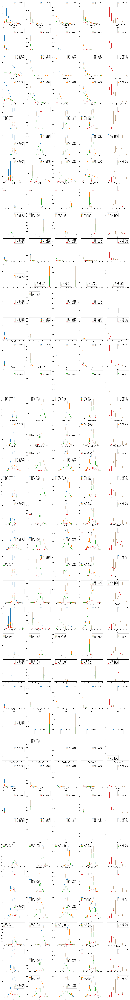

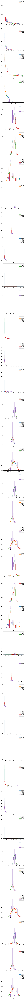

In [28]:
for label in Models['datasets'].keys():
    X_train = Models['datasets'][label]['X_train']
    y_train = Models['datasets'][label]['y_train']
    X_val = Models['datasets'][label]['X_val']
    y_val = Models['datasets'][label]['y_val']
    y_prob_val = Models['datasets'][label]['y_prob_val']
    y_prob_train = Models['datasets'][label]['y_prob_train']
    plot_features_prediction(X_train,y_train,y_prob_train)
    plot_features(X_train, y_train,binary_task=False)
    

# Extra stuff

## plot single node features

## plot separatly the datasets

Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.


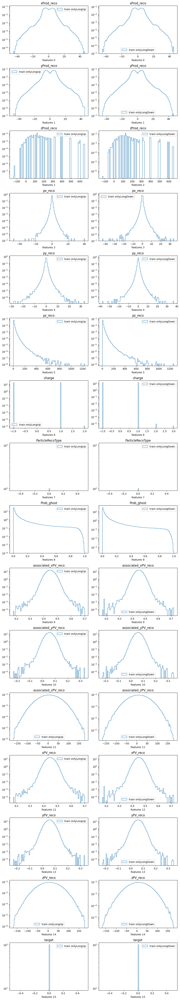

In [4]:
nplots = 16
nlabels = len(datasets.keys())
fig,axes = plt.subplots(nplots, nlabels, figsize=(5*nlabels, 55))
# Plotting the input features
for j,label in enumerate(datasets.keys()):
    for sample in ['train']:
        plot_df = ApplyCuts(datasets[label][f'input_{sample}'], 'default')
        for i,col in enumerate(plot_df.columns):
            index = (i,j) if nlabels > 1 else i
            axes[index].hist(plot_df[col], bins=100,histtype='step', label=f"{sample} {label}", density=True)
            axes[index].set_title(col)
            axes[index].set_xlabel(f"features {i}")
            axes[index].set_yscale('log')
            axes[index].legend()

plt.tight_layout()
plt.show()


## compare different training samples

In [10]:
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import tempfile
import base64

def display_scrollable_figure(fig, height_px=400):
    """
    Displays a matplotlib figure in a scrollable HTML container with fixed height.
    Parameters:
        fig (matplotlib.figure.Figure): The figure to display.
        height_px (int): Height of the scrollable container in pixels.
    """
    with tempfile.NamedTemporaryFile(suffix='.png', delete=True) as tmpfile:
        fig.savefig(tmpfile.name, format='png', bbox_inches='tight', dpi=150)
        tmpfile.seek(0)
        encoded = base64.b64encode(tmpfile.read()).decode('utf-8')

    html = f"""
    <div style="width:{height_px}px; overflow:auto; border:1px solid #ccc;">
        <img src="data:image/png;base64,{encoded}" style="display:block;">
    </div>
    """
    display(HTML(html))


Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original DataFrame.
Cut default not found. Returning original Data

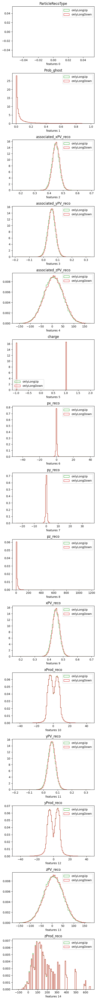

In [18]:
nplots = 15
bins,mins,maxs = {},{},{}
set_vars = set()

colors = {
    'full_sim': 'tab:blue',
    'pythia': 'tab:orange',
    'onlyLong': 'tab:green',
    'onlyLongUp': 'tab:green',
    'onlyLongDown': 'tab:red',
    }

# Plotting the input features
for sample in ['train']:
    for label in datasets.keys():
        plot_df = ApplyCuts(datasets[label][f'input_{sample}'], 'default')
        for col in datasets[label][f'input_{sample}'].columns:
            maxs[col] = max(plot_df[col].max(),maxs.get(col,-1000000))
            mins[col] = min(plot_df[col].min(),mins.get(col,10000000))
            #print(label, col,  mins.get(col,10000000), maxs.get(col,-1000000))
            
            set_vars.add(col)
    fig,axes = plt.subplots(len(set_vars), 1, figsize=(5, 50))
    
    for i,col in enumerate(sorted(set_vars)):
        for label in datasets.keys():
            plot_df = ApplyCuts(datasets[label][f'input_{sample}'], 'default')
            if col not in plot_df.columns:
                continue
            bins[col] = np.linspace(mins[col], maxs[col], 100)
            
            axes[i].hist(plot_df[col], bins=bins[col],histtype='step', label=label, color=colors[label], density=True)
            axes[i].set_title(col)
            axes[i].set_xlabel(f"features {i}")
            #axes[i].set_yscale('log')
            axes[i].legend()

    plt.tight_layout()
    plt.show()
    


## cuts effect


full_sim xProd_reco -686.6413 677.4304
full_sim yProd_reco -583.1097 574.4432
full_sim zProd_reco -63.141 2601.8464
full_sim px_reco -105.82141 104.68589
full_sim py_reco -79.62576 73.24507
full_sim pz_reco 0.40677264 6908.0566
full_sim charge -2.0 2.0
full_sim ParticleRecoType 0.0 4.0
full_sim Prob_ghost -3.0 0.9825038
full_sim associated_xPV_reco 0.2109 0.6104
full_sim associated_yPV_reco -0.0787 0.2686
full_sim associated_zPV_reco -139.2171 165.8815
full_sim xPV_reco 0.2109 0.6104
full_sim yPV_reco -0.0787 0.2686
full_sim zPV_reco -139.2171 165.8815
full_sim target 0.0 0.0
Cut default not found. Returning original DataFrame.


/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: divide by zero encountered in divide
  return n/db/n.sum(), bin_edges
/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/tmp/scapelli/ipykernel_1832628/980010953.py:37: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axes[i].set_yscale('log')
/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: divide by zero encountered in divide
  return n/db/n.sum(), bin_edges
/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


Applying cut: onlyLong
Applying cut: onlyUpDown
Applying cut: onlyNeutral


/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: divide by zero encountered in divide
  return n/db/n.sum(), bin_edges
/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: divide by zero encountered in divide
  return n/db/n.sum(), bin_edges
/user/gr1/lhcb/scapelli/DFEI/myenv/lib64/python3.9/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/tmp/scapelli/ipykernel_1832628/980010953.py:40: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.tight_layout()


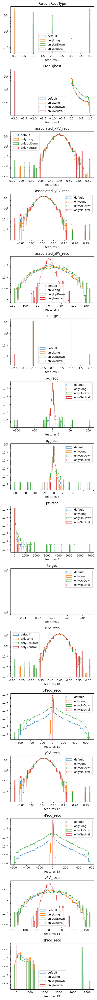

In [57]:
nplots = 15
bins,mins,maxs = {},{},{}
set_vars = set()

colors = {
    'default': 'tab:blue',
    'onlyLong': 'tab:orange',
    'onlyUpDown': 'tab:green',
    'onlyNeutral': 'tab:red',
    }

# Plotting the input features
sample = 'train'
label = 'full_sim'


plot_df = datasets[label][f'input_{sample}']
for col in datasets[label][f'input_{sample}'].columns:
    maxs[col] = max(plot_df[col].max(),maxs.get(col,-1000000))
    mins[col] = min(plot_df[col].min(),mins.get(col,10000000))
    print(label, col,  mins.get(col,10000000), maxs.get(col,-1000000))
    
    set_vars.add(col)
fig,axes = plt.subplots(len(set_vars), 1, figsize=(5, 50))

for cut_name in colors.keys():
    plot_df = ApplyCuts(datasets[label][f'input_{sample}'], cut_name)
    for i,col in enumerate(sorted(set_vars)):
        
        if col not in plot_df.columns:
            continue
        bins[col] = np.linspace(mins[col], maxs[col], 100)
        
        axes[i].hist(plot_df[col], bins=bins[col],histtype='step', label=cut_name, color=colors[cut_name], density=True)
        axes[i].set_title(col)
        axes[i].set_xlabel(f"features {i}")
        axes[i].set_yscale('log')
        axes[i].legend()

plt.tight_layout()
fig.savefig(f"plots/1D_{label}.pdf")
plt.show()


## plot correlation between variables

Applying cut: onlyLong


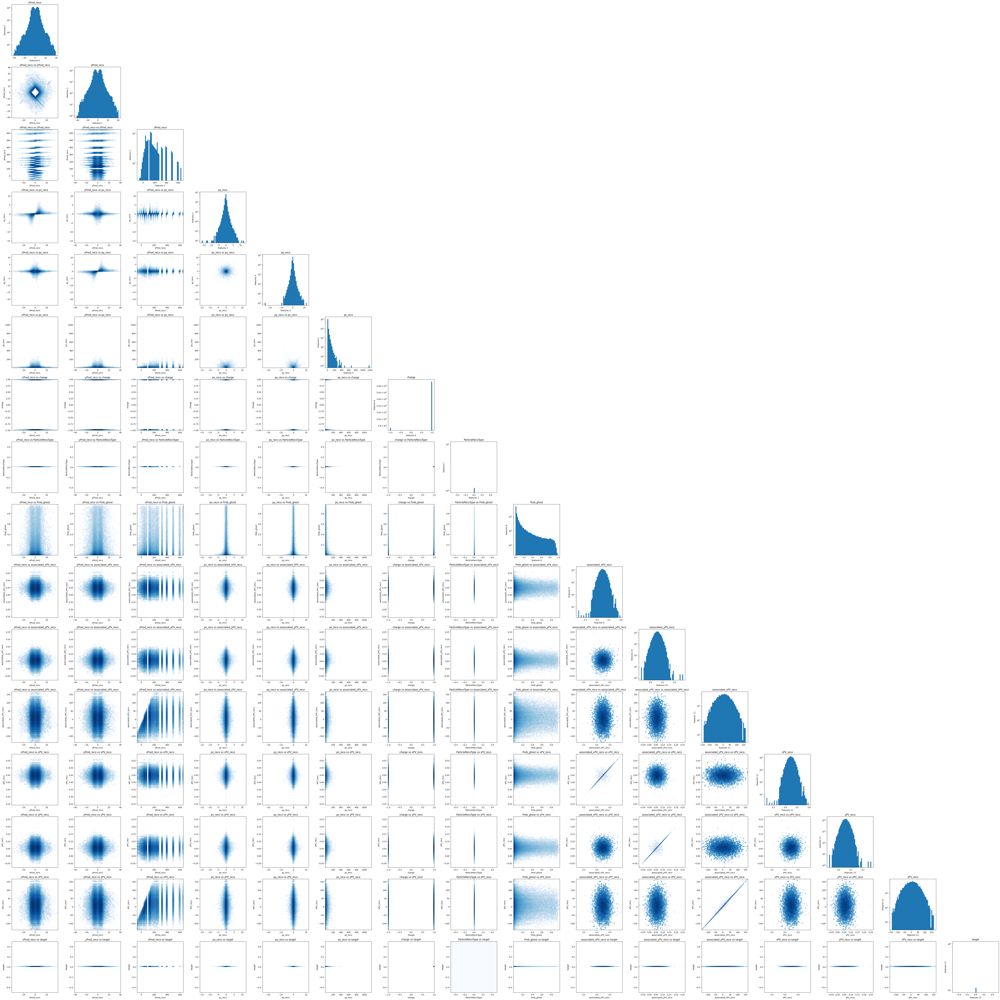

Applying cut: onlyLong
ParticleRecoType == 0 cannot be applied. Returning original DataFrame.


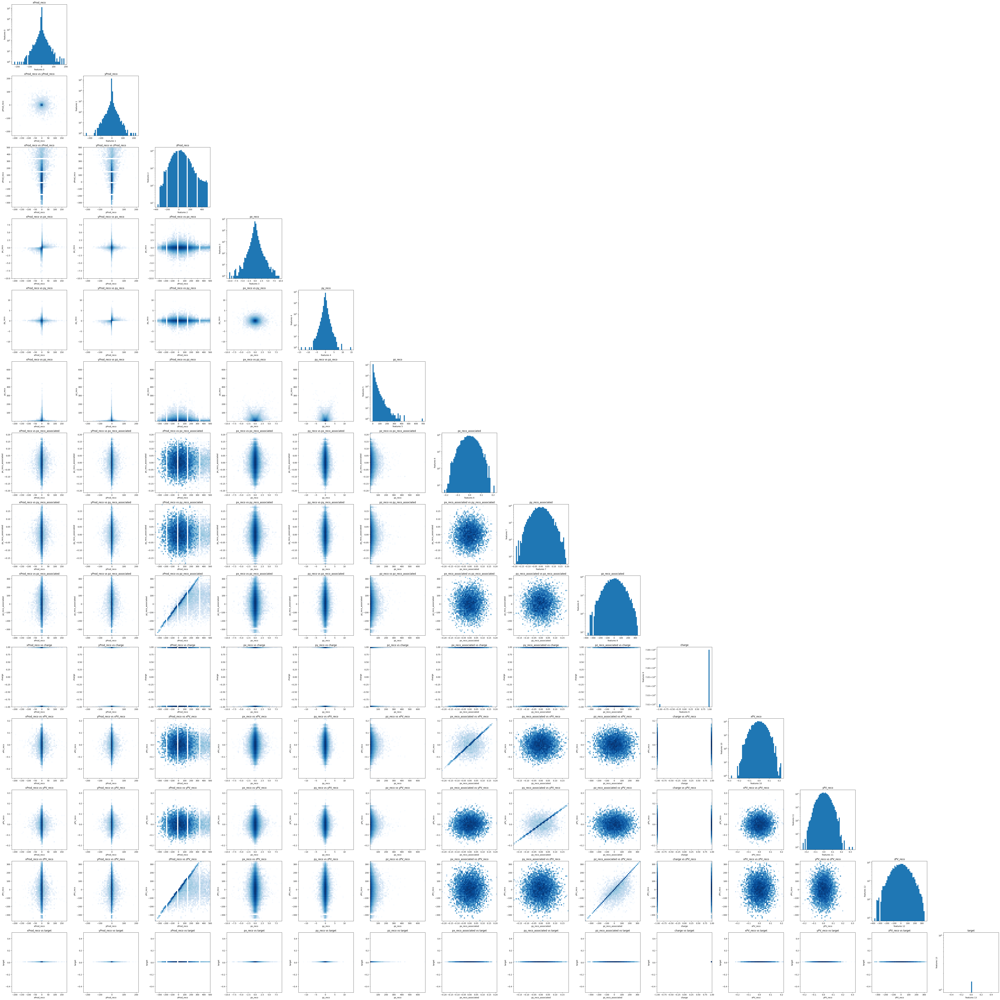

In [29]:
# plot the input features as 2d histograms with all combinations
from itertools import combinations
from matplotlib.colors import LogNorm

sample = 'input_train'


for label in datasets.keys():
    plot_df = ApplyCuts(datasets[label][sample],'onlyLong')
    Ncols = len(plot_df.columns)
    
    fig,axes = plt.subplots(Ncols, Ncols, figsize=(70, 70))
    for i,j in combinations(range(Ncols), 2):
        col1 = plot_df.columns[i]
        col2 = plot_df.columns[j]
        
        axes[j,i].hist2d(plot_df[col1], plot_df[col2], bins=50, cmap='Blues', density=True, norm=LogNorm())
        axes[j,i].set_title(f"{col1} vs {col2}")
        axes[j,i].set_xlabel(col1)
        axes[j,i].set_ylabel(col2)
        
        axes[i,j].set_visible(False) # deactivate empty plots
        #axes[j,i].set_yscale('log')
        #axes[j,i].set_xscale('log')
    for k in range(Ncols):
        axes[k,k].hist(plot_df[plot_df.columns[k]], bins=50, histtype='stepfilled', label=sample)
        axes[k,k].set_title(plot_df.columns[k])
        axes[k,k].set_yscale('log')
        axes[k,k].set_xlabel(f"features {k}")
        axes[k,k].set_ylabel(f"features {k}")
    plt.tight_layout()
    plt.show()

### correlation between variables with different cuts

In [58]:
# plot the input features as 2d histograms with all combinations
from itertools import combinations
from matplotlib.colors import LogNorm

sample = 'input_train'

colors1d = {
    'default': 'tab:blue',
    'onlyLong': 'tab:orange',
    'onlyUpDown': 'tab:green',
    'onlyNeutral': 'tab:red',
    }
colors2d = {
    'default': 'Blues',
    'onlyLong': 'Oranges',
    'onlyUpDown': 'Greens',
    'onlyNeutral': 'Reds',
    }

label = 'full_sim'
for cut_name in colors.keys():
    plot_df = ApplyCuts(datasets[label][sample],cut_name)
    Ncols = len(plot_df.columns)
    
    fig,axes = plt.subplots(Ncols, Ncols, figsize=(90, 90))
    for i,j in combinations(range(Ncols), 2):
        col1 = plot_df.columns[i]
        col2 = plot_df.columns[j]
        
        axes[j,i].hist2d(plot_df[col1], plot_df[col2], bins=50, cmap=colors2d[cut_name], density=True, norm=LogNorm())
        axes[j,i].set_title(f"{col1} vs {col2}")
        axes[j,i].set_xlabel(col1)
        axes[j,i].set_ylabel(col2)
        
        axes[i,j].set_visible(False) # deactivate empty plots
        #axes[j,i].set_yscale('log')
        #axes[j,i].set_xscale('log')
    for k in range(Ncols):
        axes[k,k].hist(plot_df[plot_df.columns[k]], bins=50, color=colors1d[cut_name],histtype='stepfilled', label=sample)
        axes[k,k].set_title(plot_df.columns[k])
        axes[k,k].set_yscale('log')
        axes[k,k].set_xlabel(f"features {k}")
        axes[k,k].set_ylabel(f"features {k}")
    plt.tight_layout()
    fig.savefig(f"plots/{label}_{cut_name}.pdf")
    plt.show()
    

Cut default not found. Returning original DataFrame.


Applying cut: onlyLong


Applying cut: onlyUpDown


Applying cut: onlyNeutral


## Input numpy files


In [27]:
file_input = files_input_tr[1]
file_target = files_target_tr[1]
file_input,file_target

('/user/gr1/lhcb/scapelli/DFEI/lhcbdfei/data_handling/input_formatting/run3_onlyLong_magdown/training_dataset/input_1.npy',
 '/user/gr1/lhcb/scapelli/DFEI/lhcbdfei/data_handling/input_formatting/run3_onlyLong_magdown/training_dataset/target_1.npy')

In [28]:
graph = {
    'input': np.load(file_input, allow_pickle=True).item(),
    'target': np.load(file_target, allow_pickle=True).item(),
    }

In [29]:
print(graph['input']['nodes'].shape,graph['input']['edges'].shape)

(130, 15) (16514, 4)


In [17]:
print(graph['target']['nodes'].shape,graph['target']['edges'].shape)

(88, 1) (7560, 10)


(array([9., 0., 0., 0., 0., 0., 0., 0., 0., 1.]),
 array([0.        , 0.1       , 0.2       , 0.30000001, 0.40000001,
        0.5       , 0.60000002, 0.69999999, 0.80000001, 0.89999998,
        1.        ]),
 <BarContainer object of 10 artists>)

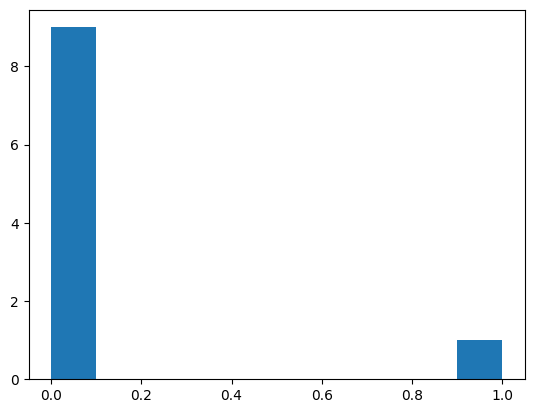

In [26]:
plt.hist(graph['target']['edges'][3])

## Plot Particle and Relation root files

## plot particle features

In [6]:
import uproot

In [7]:
particles_root = "/user/gr1/lhcb/scapelli/DFEI/fullsim_folder/P_and_R_onlyLong/Event_data_particles_bquark_Run3_inclusiveb_magup_beautiful_ancestors_90732events_allbkgtracks.root"

with uproot.open(particles_root) as f:
    print(f["Particles"].keys())

['EventNumber', 'ExpandedEventNumber', 'ExpandedParticleIndex', 'ExpandedPrimaryHeavyHadronIndex', 'FromPrimaryHeavyHadron', 'MotherId', 'MotherIndex', 'NumVisDaugh', 'Part_ISO_InSignalCandidate', 'ParticleIndex', 'ParticleRecoType', 'ParticleType', 'PrimaryHeavyHadronIndex', 'Prob_e', 'Prob_gamma', 'Prob_ghost', 'Prob_k', 'Prob_mu', 'Prob_p', 'Prob_pi', 'Prob_pi0', 'TriggerKey', 'associated_ip', 'associated_ip_reco', 'associated_xPV', 'associated_xPV_reco', 'associated_yPV', 'associated_yPV_reco', 'associated_zPV', 'associated_zPV_reco', 'cand_B0_ISOLATION_BDT', 'charge', 'gammactau', 'id', 'inGeomAcc', 'ip', 'ip_reco', 'isCharged', 'isFinal', 'isbhadron', 'ischadron', 'pt', 'pt_reco', 'px', 'px_reco', 'py', 'py_reco', 'pz', 'pz_reco', 'xPV', 'xPV_reco', 'xProd', 'xProd_reco', 'yPV', 'yPV_reco', 'yProd', 'yProd_reco', 'zPV', 'zPV_reco', 'zProd', 'zProd_reco']


In [8]:
particles_df = {}

load_vars = ['pt','ip','EventNumber','pt_reco', 'ip_reco',
             'ParticleRecoType', 'ParticleType','id',
             'isFinal','Prob_e', 'Prob_gamma', 'Prob_ghost', 'Prob_k', 'Prob_mu', 'Prob_p', 'Prob_pi', 'Prob_pi0',
             'xPV','yPV','zPV','associated_xPV','associated_yPV','associated_zPV','xPV_reco','yPV_reco','zPV_reco','associated_xPV_reco','associated_yPV_reco','associated_zPV_reco']

particles_root = "/user/gr1/lhcb/scapelli/DFEI/fullsim_folder/P_and_R_onlyLong/Event_data_particles_bquark_Run3_inclusiveb_magup_beautiful_ancestors_90732events_allbkgtracks.root"
with uproot.open(particles_root) as f:
    particles_df['onlyLongUp'] = pd.DataFrame(f["Particles"].arrays(load_vars,library="np"))
    
particles_root = "/user/gr1/lhcb/scapelli/DFEI/fullsim_folder/P_and_R_onlyLong/Event_data_particles_bquark_Run3_inclusiveb_magdown_beautiful_ancestors_90754events_allbkgtracks.root"
with uproot.open(particles_root) as f:
    particles_df['onlyLongDown'] = pd.DataFrame(f["Particles"].arrays(load_vars,library="np"))

In [9]:
evt_numbers = {
    'onlyLongUp': { 'train': 0, 'val': 81658 },
    'onlyLongDown': { 'train': 0, 'val': 81678 },
}
for pol in ['onlyLongUp', 'onlyLongDown']:
    for sample in ['train', 'val']:
        # First, reset the index of df1 to make EventNumber and particleIndex columns
        df1_reset = graphs[pol][f"input_{sample}"]['nodes'].reset_index().rename(columns={'level_0': 'EventNumber', 'level_1': 'particleIndex',8: 'Prob_ghost'})
        df1_reset['EventNumber'] = df1_reset['EventNumber'].astype(int)+ evt_numbers[pol][sample]  # Adjust EventNumber based on the sample

        # Merge df1 with df2 using EventNumber and Prob_ghost as keys
        merged = pd.merge(
            df1_reset,
            particles_df[pol][['EventNumber', 'Prob_ghost', 'pt_reco', 'ip_reco']],
            on=['EventNumber', 'Prob_ghost'],
            how='left'  # use 'left' join to keep all entries from df1
        )

        # Set the index back to (EventNumber, particleIndex)
        merged['EventNumber'] = merged['EventNumber'].astype(int) - evt_numbers[pol][sample]
        merged.set_index(['EventNumber', 'particleIndex'], inplace=True)

        # If desired, assign the merged DataFrame back to df1
        graphs[pol][f"input_{sample}"]['nodes'] = merged.rename(columns={'Prob_ghost': 8, 'pt_reco': 15, 'ip_reco': 16})
        graphs[pol][f"input_{sample}"]['nodes'].index.set_names({'EventNumber':0, 'particleIndex':1},inplace=True)

In [10]:
graphs['onlyLongDown'][f"input_train"]['nodes'].loc[19996]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
1,,,,,,,,,,,,,,,,,
0,5.1921,-3.4741,150.641006,0.191767,-0.140887,8.510374,1.0,0.0,0.029089,0.4478,0.0636,-60.954700,0.4478,0.0636,-60.954700,0.237957,0.044818
1,-2.0229,-5.4477,161.858994,-0.136219,-0.306803,6.698414,-1.0,0.0,0.013583,0.4140,0.0667,40.310699,0.4140,0.0667,40.310699,0.335684,0.064562
2,7.1951,-1.1584,175.641006,2.011607,-0.357577,39.923573,-1.0,0.0,0.008841,0.4140,0.0667,40.310699,0.4140,0.0667,40.310699,2.043141,0.039447
3,6.1327,2.1276,149.358994,1.948582,0.702215,37.166603,-1.0,0.0,0.005790,0.4140,0.0667,40.310699,0.4140,0.0667,40.310699,2.071250,0.001894
4,-0.2009,-7.0910,161.858994,-0.051413,-0.562420,9.682364,1.0,0.0,0.003200,0.4255,0.0755,37.333401,0.4255,0.0755,37.333401,0.564765,0.074433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,2.8237,7.3555,149.358994,0.123022,0.383449,4.486604,-1.0,0.0,0.423023,0.4801,0.0700,62.893902,0.4801,0.0700,62.893902,0.402700,0.106787
122,3.7147,5.6946,149.358994,0.206822,0.353250,3.877252,1.0,0.0,0.023949,0.4910,0.0133,87.576599,0.4910,0.0133,87.576599,0.409342,0.089822
123,8.1482,0.3423,324.359009,0.260597,0.008818,9.109789,1.0,0.0,0.297366,0.4661,0.0222,53.636700,0.4661,0.0222,53.636700,0.260746,0.092224


In [239]:
relations_root = "/user/gr1/lhcb/scapelli/DFEI/fullsim_folder/P_and_R/Event_data_relations_bquark_Run3_inclusiveb_magup_beautiful_ancestors_90732events_allbkgtracks.root"

with uproot.open(relations_root) as f:
    print(f["ParticleRelations"].keys())

['BothInGeomAcc', 'DOCA', 'DOCA_reco', 'ExpandedEventNumber', 'FirstParticleIndex', 'FromSameAssociatedPV_reco', 'FromSameHeavyHadron', 'FromSamePV', 'LCA', 'LCA_class0', 'LCA_class1', 'LCA_class10', 'LCA_class2', 'LCA_class3', 'LCA_class4', 'LCA_class5', 'LCA_class6', 'LCA_class7', 'LCA_class8', 'LCA_class9', 'LCA_ids', 'MaxDecayChainLength', 'SecondParticleIndex', 'TopoLCA', 'TopoLCA_class0', 'TopoLCA_class1', 'TopoLCA_class10', 'TopoLCA_class2', 'TopoLCA_class3', 'TopoLCA_class4', 'TopoLCA_class5', 'TopoLCA_class6', 'TopoLCA_class7', 'TopoLCA_class8', 'TopoLCA_class9', 'TopoLCA_ids', 'TopoMaxDecayChainLength', 'delta_z0', 'delta_z0_reco', 'p1_ParticleRecoType', 'p1_isCharged', 'p2_ParticleRecoType', 'p2_isCharged', 'theta', 'theta_reco', 'trdist', 'trdist_reco']


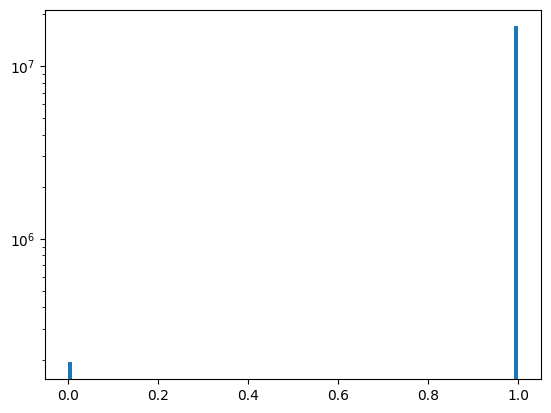

In [63]:
plt.hist(df.loc[:,'isFinal'], bins=100, histtype='stepfilled')
plt.yscale('log')
plt.show()

Cut default not found. Returning original DataFrame.


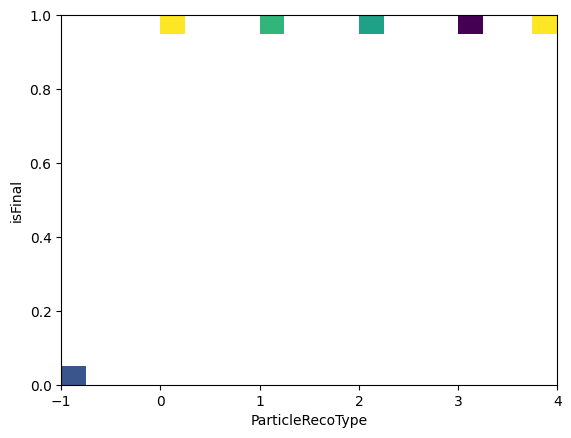

In [65]:
x,y = 'ParticleRecoType','isFinal'

new_df = ApplyCuts(df, 'default')

plt.hist2d(new_df[x],new_df[y],norm=LogNorm(), bins=20)
plt.xlabel(x)
plt.ylabel(y)
plt.show()